In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
!git clone https://github.com/facebookresearch/segment-anything-2
%cd /content/segment-anything-2
!pip install -q -e .

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 974, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 974 (delta 17), reused 21 (delta 7), pack-reused 936 (from 1)
Receiving objects: 100% (974/974), 128.94 MiB | 29.87 MiB/s, done.
Resolving deltas: 100% (334/334), done.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.9 MB/s eta 0:00:00
  Buil

In [3]:
!pip install opencv-python

!wget https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt

--2024-11-05 14:30:21--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.14, 3.163.189.108, 3.163.189.96, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.14|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184309650 (176M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2_hiera_small.pt’

sam2_hiera_small.pt 100%[===================>] 175.77M   120MB/s    in 1.5s    

2024-11-05 14:30:22 (120 MB/s) - ‘sam2_hiera_small.pt’ saved [184309650/184309650]



In [4]:
# !wget -O sam2_hiera_tiny.pt "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt"
# !wget -O sam2_hiera_small.pt "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt"
# !wget -O sam2_hiera_base_plus.pt "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_base_plus.pt"
# !wget -O sam2_hiera_large.pt "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt"

--2024-11-05 14:30:22--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.14, 3.163.189.108, 3.163.189.96, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.14|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155906050 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2_hiera_tiny.pt’

sam2_hiera_tiny.pt  100%[===================>] 148.68M   174MB/s    in 0.9s    

2024-11-05 14:30:23 (174 MB/s) - ‘sam2_hiera_tiny.pt’ saved [155906050/155906050]

--2024-11-05 14:30:23--  https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.14, 3.163.189.108, 3.163.189.96, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.14|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184309650 (176M) [application/vn

In [5]:

import glob
from PIL import Image
import cv2
import numpy as np
import os
import pandas as pd
import cv2
import torch.nn.utils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.model_selection import train_test_split
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from matplotlib import colors as mcolors

/content/segment-anything-2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


In [6]:
maskfolder = '/content/drive/MyDrive/PurdueWork/Pothole Segmentation/train/masks'
mask_files = sorted(glob.glob(maskfolder + '/*.png'))
maskarr = [cv2.imread(i, cv2.IMREAD_GRAYSCALE) for i in mask_files]
masks = np.array(maskarr)

imgfolder = '/content/drive/MyDrive/PurdueWork/Pothole Segmentation/train/images'
img_files = sorted(glob.glob(imgfolder + '/*.jpg'))
imgarr = [cv2.imread(i) for i in img_files]
images = np.array(imgarr)


data = {
    "image": [Image.fromarray(im) for im in images],
    "masks": [Image.fromarray(mas) for mas in masks]
}

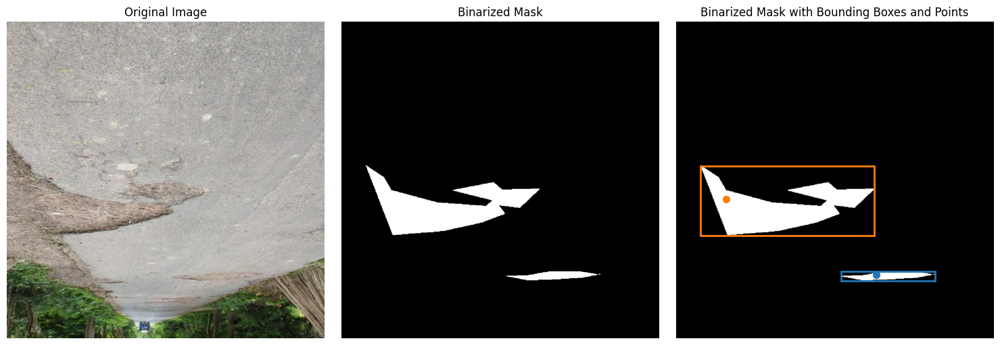

Number of unique potholes: 2


In [44]:
def read_batch(data, visualize_data=False):
    index = np.random.randint(len(data['image']))

    Img = data["image"][index]
    ann_map = data["masks"][index]

    # Resize image and mask
    r = np.min([1024 / Img.size[0], 1024 / Img.size[1]])  # Scaling factor
    Img = Img.resize((int(Img.size[0] * r), int(Img.size[1] * r)))
    ann_map = ann_map.resize((int(ann_map.size[0] * r), int(ann_map.size[1] * r)), Image.NEAREST)

    Img = np.array(Img)
    ann_map = np.array(ann_map)
    binary_mask = (ann_map > 0).astype(np.uint8)

    # Detect contours in the binary mask
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bounding_boxes = []
    all_points = []
    labels = []

    for contour in contours:
        # Bounding box for each contour
        x, y, w, h = cv2.boundingRect(contour)
        bounding_boxes.append((x, y, x + w, y + h))

        #  random points within the contour area so that every instance gets some points
        mask_region = np.zeros_like(binary_mask)
        cv2.drawContours(mask_region, [contour], -1, 1, thickness=cv2.FILLED)
        coords = np.argwhere(mask_region > 0)

        num_points = max(1, int(len(coords) / 2000000))
        points = []
        for _ in range(num_points):
            yx = coords[np.random.randint(len(coords))]
            points.append([yx[1], yx[0]])
        all_points.append(points)


        labels.append(1)

    flabel = np.array(labels, dtype=np.float32).reshape(-1, 1)

    if visualize_data:
        plt.figure(figsize=(15, 5))

        # Original Image
        plt.subplot(1, 3, 1)
        plt.title('Original Image')
        plt.imshow(cv2.cvtColor(Img, cv2.COLOR_BGR2RGB))
        plt.axis('off')

        # Binary Mask
        plt.subplot(1, 3, 2)
        plt.title('Binarized Mask')
        plt.imshow(binary_mask, cmap='gray')
        plt.axis('off')

        # Mask with Bounding Boxes and Points
        plt.subplot(1, 3, 3)
        plt.title('Binarized Mask with Bounding Boxes and Points')
        plt.imshow(binary_mask, cmap='gray')

        # Bounding boxes and points
        colors = list(mcolors.TABLEAU_COLORS.values())
        for i, (bbox, points) in enumerate(zip(bounding_boxes, all_points)):
            x1, y1, x2, y2 = bbox
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor=colors[i % len(colors)], facecolor='none'))
            for point in points:
                plt.scatter(point[0], point[1], c=colors[i % len(colors)], s=50, label=f'Point {i + 1}' if i == 0 else "")

        plt.axis('off')
        plt.tight_layout()
        plt.show()

        all_points = np.squeeze(all_points)

    return Img, binary_mask, all_points, flabel



images, masks, points_list, labels = read_batch(data, visualize_data=True)
print(f"Number of unique potholes: {len(labels)}")


In [8]:
points_list

array([[ 22, 463],
       [822, 409],
       [844, 306],
       [769, 512]])

In [9]:
sam2_checkpoint = "sam2_hiera_small.pt" # path to model weight
model_cfg = "sam2_hiera_s.yaml" # model config

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device="cuda") # load model
predictor = SAM2ImagePredictor(sam2_model) # load net

In [10]:
predictor.model.sam_mask_decoder.train(True) # enable training of mask decoder
predictor.model.sam_prompt_encoder.train(True) # enable training of prompt encoder


PromptEncoder(
  (pe_layer): PositionEmbeddingRandom()
  (point_embeddings): ModuleList(
    (0-3): 4 x Embedding(1, 256)
  )
  (not_a_point_embed): Embedding(1, 256)
  (mask_downscaling): Sequential(
    (0): Conv2d(1, 4, kernel_size=(2, 2), stride=(2, 2))
    (1): LayerNorm2d()
    (2): GELU(approximate='none')
    (3): Conv2d(4, 16, kernel_size=(2, 2), stride=(2, 2))
    (4): LayerNorm2d()
    (5): GELU(approximate='none')
    (6): Conv2d(16, 256, kernel_size=(1, 1), stride=(1, 1))
  )
  (no_mask_embed): Embedding(1, 256)
)

In [11]:
optimizer=torch.optim.AdamW(params=predictor.model.parameters(),lr=1e-5,weight_decay=4e-5)
scaler = torch.cuda.amp.GradScaler() # set mixed precision

In [12]:
# Training loop
for itr in range(10000):
    with torch.cuda.amp.autocast():  # cast to mix precision

        image, mask, input_point, input_label = read_batch(data)  # load data batch
        if mask.shape[0] == 0:
            continue  # ignore empty batches
        predictor.set_image(image)  # apply SAM image encoder to the image



        # Ensure input_point and input_label have the correct dimensions
        if len(input_point) == 0 or len(input_label) == 0:
            continue  # skip if input_point or input_label is empty

        # prompt encoding
        mask_input, unnorm_coords, labels, unnorm_box = predictor._prep_prompts(
            input_point, input_label, box=None, mask_logits=None, normalize_coords=True
        )
        sparse_embeddings, dense_embeddings = predictor.model.sam_prompt_encoder(
            points=(unnorm_coords, labels), boxes=None, masks=None
        )

        # mask decoder
        batched_mode = unnorm_coords.shape[0] > 1  # multi-object prediction
        high_res_features = [
            feat_level[-1].unsqueeze(0) for feat_level in predictor._features["high_res_feats"]
        ]
        low_res_masks, prd_scores, _, _ = predictor.model.sam_mask_decoder(
            image_embeddings=predictor._features["image_embed"][-1].unsqueeze(0),
            image_pe=predictor.model.sam_prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=True,
            repeat_image=batched_mode,
            high_res_features=high_res_features,
        )
        prd_masks = predictor._transforms.postprocess_masks(
            low_res_masks, predictor._orig_hw[-1]
        )  # Upscale the masks to the original image resolution

        # Segmentation loss calculation
        gt_mask = torch.tensor(mask.astype(np.float32)).cuda()
        prd_mask = torch.sigmoid(prd_masks[:, 0])
        seg_loss = (
            -gt_mask * torch.log(prd_mask + 0.00001) - (1 - gt_mask) * torch.log(1 - prd_mask + 0.00001)
        ).mean()
        gt_mask = gt_mask.unsqueeze(0)

        # IOU (score) loss calculation
        inter = (gt_mask * (prd_mask > 0.5)).sum(1).sum(1)
        iou = inter / (
            gt_mask.sum(1).sum(1) + (prd_mask > 0.5).sum(1).sum(1) - inter
        )
        score_loss = torch.abs(prd_scores[:, 0] - iou).mean()
        loss = seg_loss + score_loss * 0.05  # mix losses

        # Apply backpropagation
        predictor.model.zero_grad()  # empty gradient
        scaler.scale(loss).backward()  # backpropagate
        scaler.step(optimizer)
        scaler.update()  # mix precision

        if itr % 1000 == 0:
            torch.save(predictor.model.state_dict(), "model.torch")  # save model

        if itr == 0:
            mean_iou = 0
        mean_iou = mean_iou * 0.99 + 0.01 * np.mean(iou.cpu().detach().numpy())
        print("step", itr, "Accuracy(IOU)=", mean_iou)


Streaming output truncated to the last 5000 lines.
step 4801 Accuracy(IOU)= 0.6289619065981403
step 4802 Accuracy(IOU)= 0.6262858185256206
step 4803 Accuracy(IOU)= 0.6291265005224781
step 4804 Accuracy(IOU)= 0.6288680975844759
step 4805 Accuracy(IOU)= 0.6290723222253914
step 4806 Accuracy(IOU)= 0.6308322732031956
step 4807 Accuracy(IOU)= 0.6317235615389355
step 4808 Accuracy(IOU)= 0.6334031729570468
step 4809 Accuracy(IOU)= 0.6354301172082351
step 4810 Accuracy(IOU)= 0.6370404777535675
step 4811 Accuracy(IOU)= 0.6387734668883472
step 4812 Accuracy(IOU)= 0.636866972134358
step 4813 Accuracy(IOU)= 0.6385936324129381
step 4814 Accuracy(IOU)= 0.6355448743190943
step 4815 Accuracy(IOU)= 0.6363941990019593
step 4816 Accuracy(IOU)= 0.6361817460313336
step 4817 Accuracy(IOU)= 0.6377115239346371
step 4818 Accuracy(IOU)= 0.6378143681832058
step 4819 Accuracy(IOU)= 0.640523619573357
step 4820 Accuracy(IOU)= 0.643013646453452
step 4821 Accuracy(IOU)= 0.6427569263650315
step 4822 Accuracy(IOU)= 0.6

# inference

In [21]:
test_image='/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/images/148_jpg.rf.a7c11f3077b2ad45a58c7f0ca92e4425.jpg'
test_mask="/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/masks/148_jpg.rf.a7c11f3077b2ad45a58c7f0ca92e4425_mask.png"

In [22]:
# use bfloat16 for the entire script (memory efficient)
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()


image_path = r'/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/images/148_jpg.rf.a7c11f3077b2ad45a58c7f0ca92e4425.jpg'
mask_path = r"/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/masks/148_jpg.rf.a7c11f3077b2ad45a58c7f0ca92e4425_mask.png"
num_samples = 30 # number of points/segment to sample

In [23]:
def read_image(image_path, mask_path):
   img = cv2.imread(image_path)[..., ::-1]  # Convert BGR to RGB
   mask = cv2.imread(mask_path, 0)
   r = np.min([1024 / img.shape[1], 1024 / img.shape[0]])
   img = cv2.resize(img, (int(img.shape[1] * r), int(img.shape[0] * r)))
   mask = cv2.resize(mask, (int(mask.shape[1] * r), int(mask.shape[0] * r)), interpolation=cv2.INTER_NEAREST)
   return img, mask

def get_points(mask, num_points):  # Sample points inside the input mask
   points = []
   coords = np.argwhere(mask > 0)
   for i in range(num_points):
       yx = np.array(coords[np.random.randint(len(coords))])
       points.append([[yx[1], yx[0]]])
   return np.array(points)

In [24]:
# read image and sample points
image,mask = read_image(image_path, mask_path)
input_points = get_points(mask,num_samples)

In [25]:
sam2_checkpoint = "sam2_hiera_small.pt" # "sam2_hiera_large.pt"
model_cfg = "sam2_hiera_s.yaml" # "sam2_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device="cuda")


In [26]:
# Build net and load weights
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load("model.torch"))


<All keys matched successfully>

In [27]:
from google.colab.patches import cv2_imshow

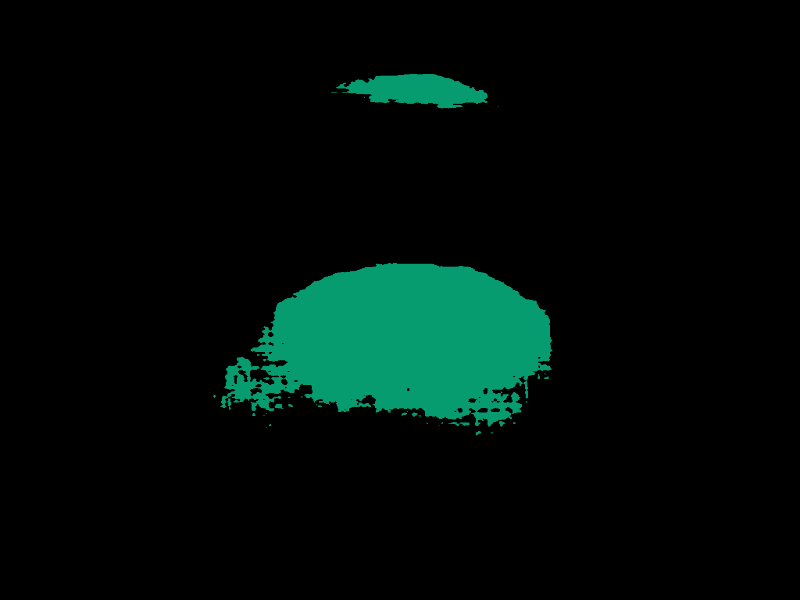

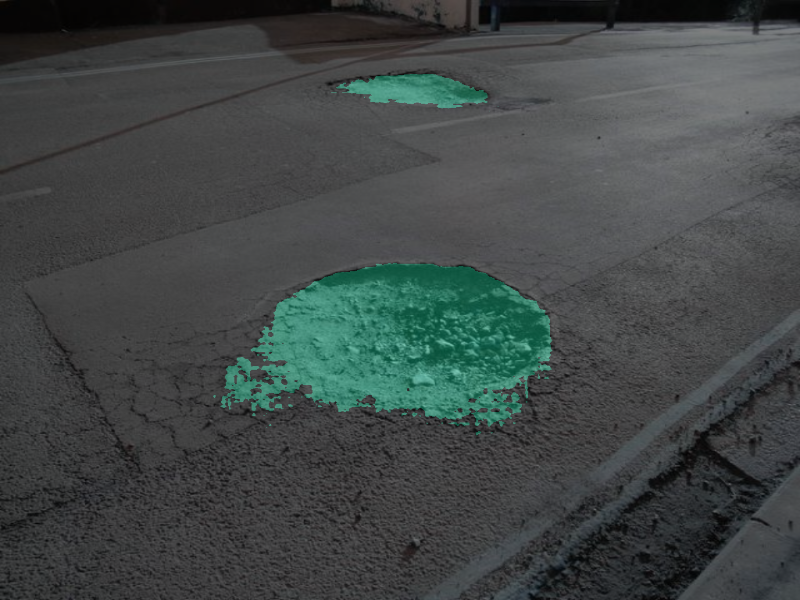

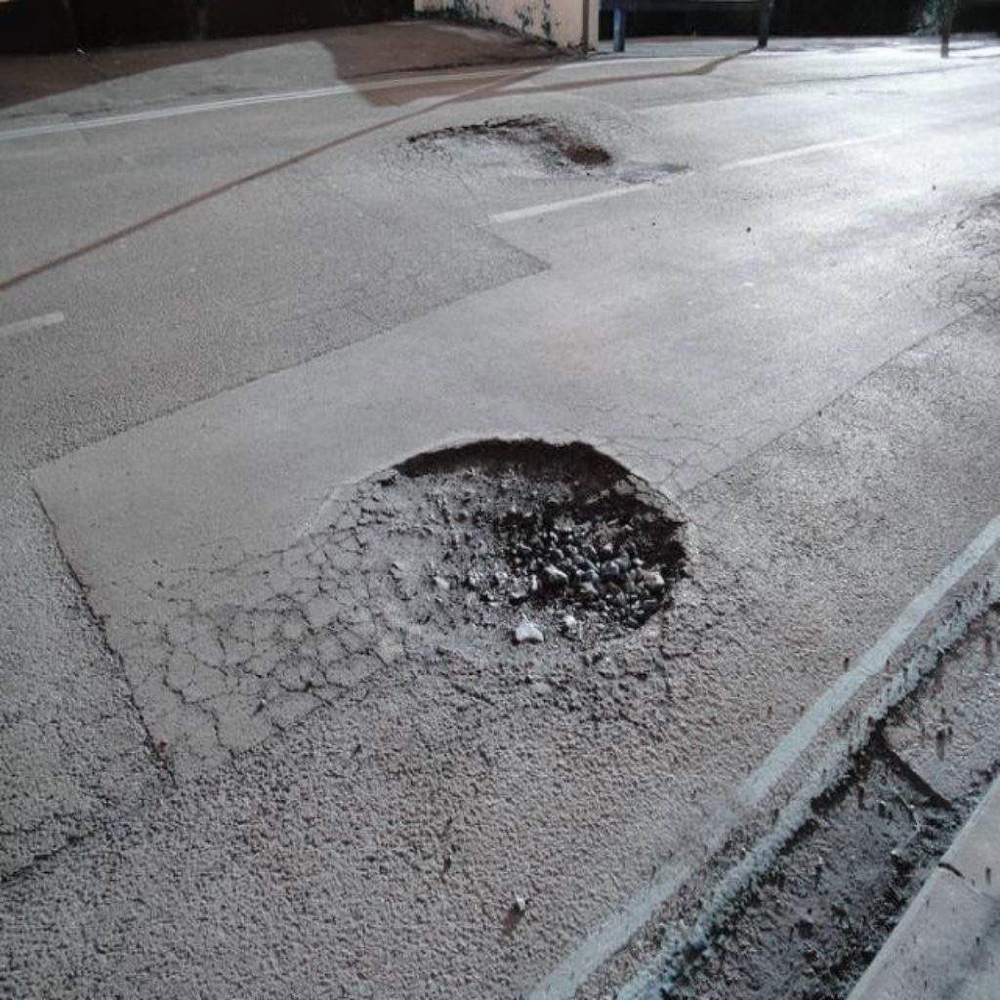

-1

In [28]:

with torch.no_grad():
        predictor.set_image(image)
        masks, scores, logits = predictor.predict(
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0],1])
        )

# Short predicted masks from high to low score

np_masks = np.array(masks[:,0])
np_scores = scores[:,0]
shorted_masks = np_masks[np.argsort(np_scores)][::-1]


# Stitch predicted mask into one segmentation mask

seg_map = np.zeros_like(shorted_masks[0],dtype=np.uint8)
occupancy_mask = np.zeros_like(shorted_masks[0],dtype=bool)
for i in range(shorted_masks.shape[0]):
    mask = shorted_masks[i]
    if (mask*occupancy_mask).sum()/mask.sum()>0.15: continue
    mask[occupancy_mask]=0
    # Convert mask to boolean for indexing
    seg_map[mask > 0.5] = i + 1  # Assuming 0.5 as the threshold for positive prediction
    occupancy_mask[mask > 0.5] = 1


# colored annotation map
height, width = seg_map.shape

# an empty RGB image for the colored annotation
rgb_image = np.zeros((height, width, 3), dtype=np.uint8)
# Map each class number to a random  color


for id_class in range(1,seg_map.max()+1):
    rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

# save and display

cv2.imwrite("annotation.png",rgb_image)
cv2.imwrite("mix.png",(rgb_image/2+image/2).astype(np.uint8))

cv2_imshow(cv2.resize(rgb_image, (800, 600))) # Use cv2_imshow instead of cv2.imshow
cv2_imshow(cv2.resize((rgb_image/2+image/2).astype(np.uint8),(800, 600))) # Use cv2_imshow instead of cv2.imshow
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow

cv2.waitKey()

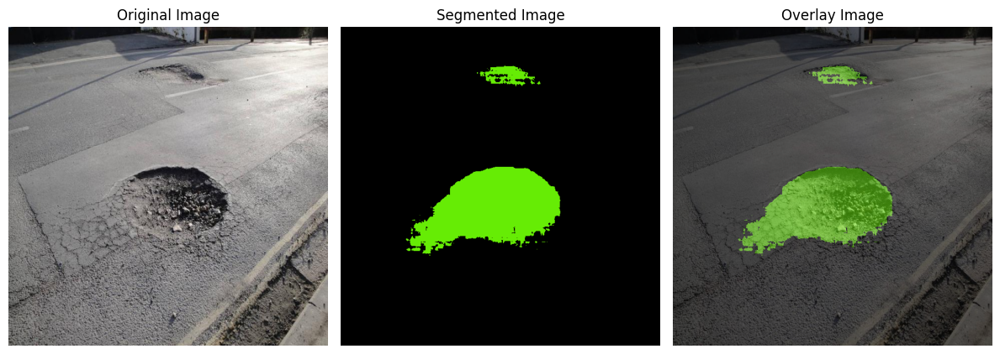

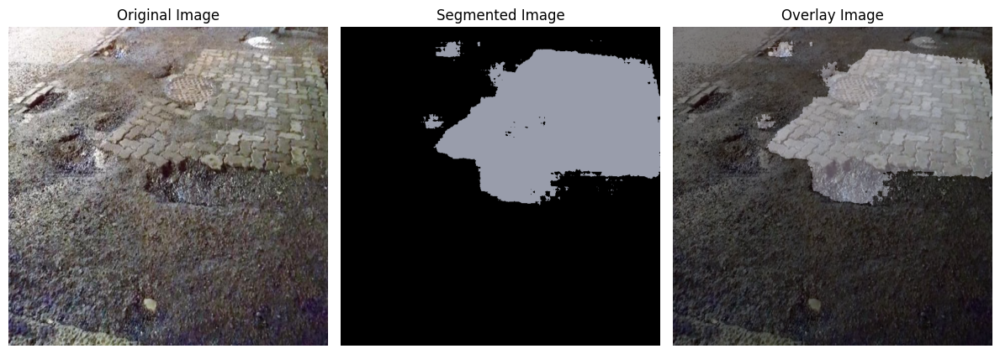

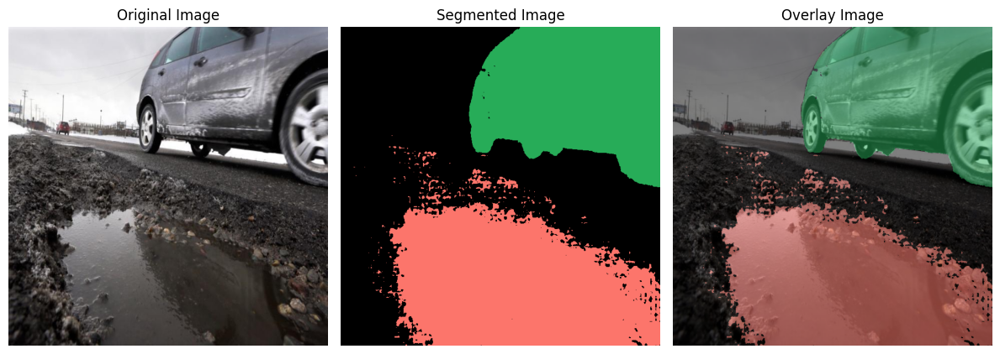

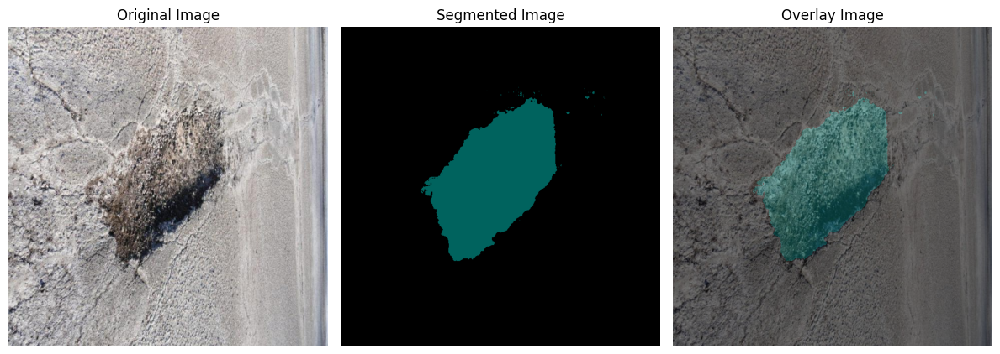

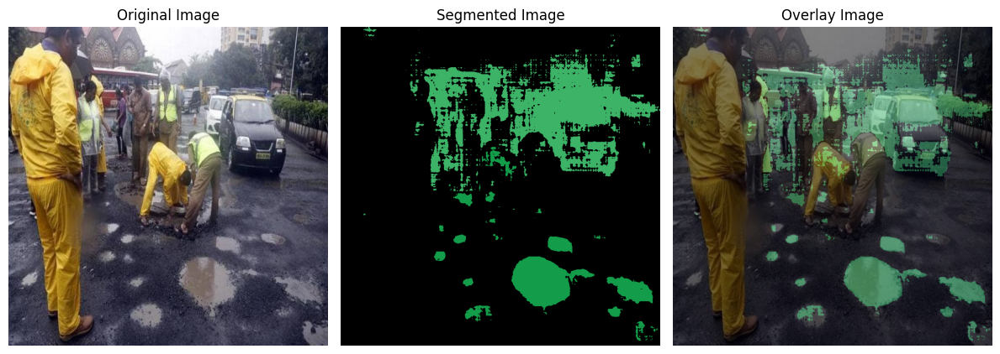

...

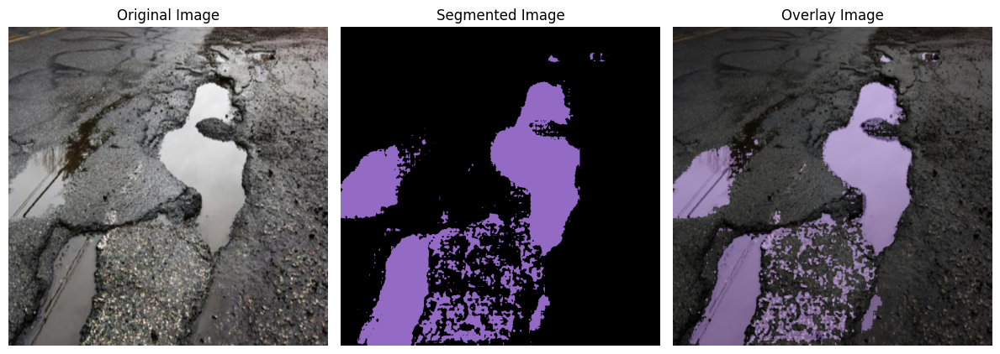

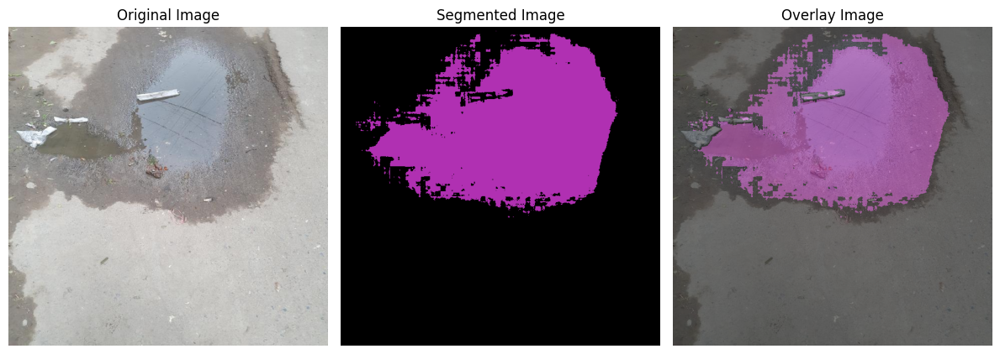

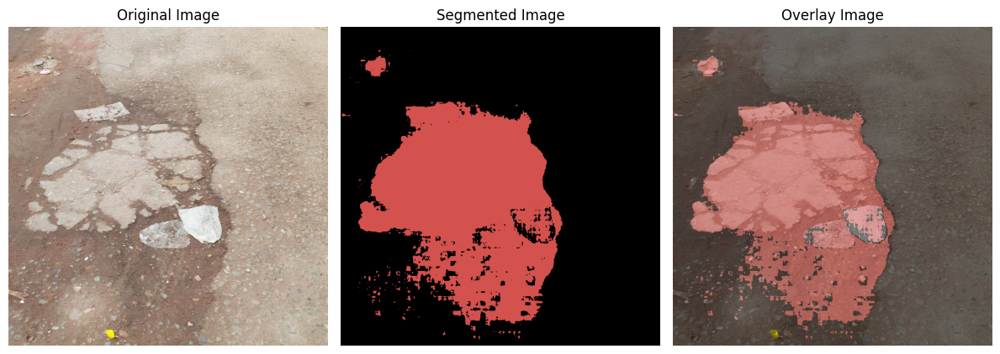

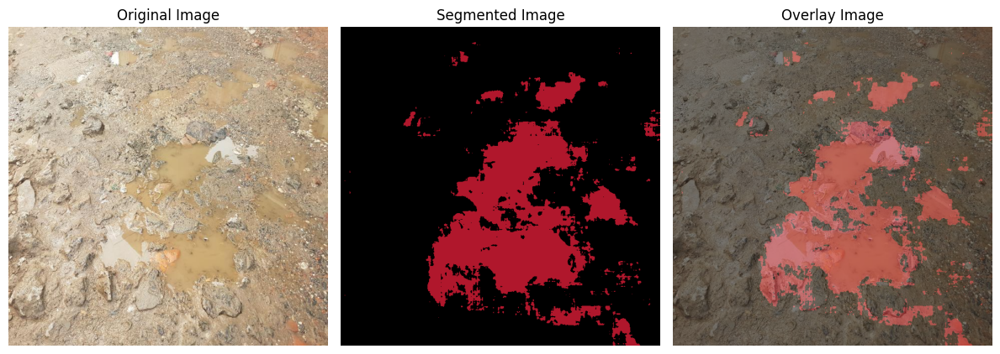

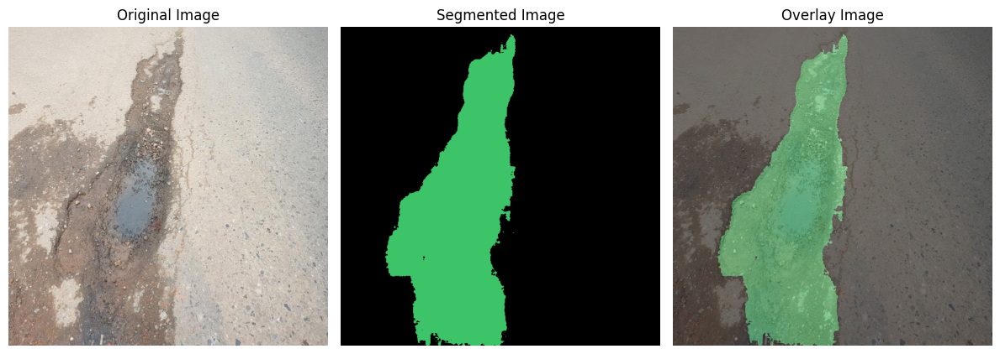

In [34]:

image_dir = '/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/images'
mask_dir = '/content/drive/MyDrive/PurdueWork/Pothole Segmentation/test/masks'
image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))



for image_file, mask_file in zip(image_files, mask_files):
    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)


    with torch.no_grad():
        predictor.set_image(image)
        masks, scores, logits = predictor.predict(
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0], 1])
        )

        # Short predicted masks from high to low score
        np_masks = np.array(masks[:, 0])  # Assuming masks is already a numpy array
        np_scores = scores[:, 0]
        shorted_masks = np_masks[np.argsort(np_scores)][::-1]

        # Stitch predicted mask into one segmentation mask
        seg_map = np.zeros_like(shorted_masks[0], dtype=np.uint8)
        occupancy_mask = np.zeros_like(shorted_masks[0], dtype=bool)

        for i in range(shorted_masks.shape[0]):
            mask = shorted_masks[i]
            if (mask * occupancy_mask).sum() / mask.sum() > 0.15:
                continue
            mask[occupancy_mask] = 0
            seg_map[mask > 0.5] = i + 1  # Assuming 0.5 as the threshold for positive prediction
            occupancy_mask[mask > 0.5] = 1

        # Create colored annotation map
        height, width = seg_map.shape
        rgb_image = np.zeros((height, width, 3), dtype=np.uint8)

        for id_class in range(1, seg_map.max() + 1):
            rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

    # Save and display the results
    cv2.imwrite("annotation.png", rgb_image)
    cv2.imwrite("mix.png", (rgb_image / 2 + image / 2).astype(np.uint8))

    # Plot using matplotlib
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB))
    plt.title('Segmented Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor((rgb_image / 2 + image / 2).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title('Overlay Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [43]:
def compute_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true.flatten(), y_pred.flatten())
    precision = precision_score(y_true.flatten(), y_pred.flatten(), average='macro', zero_division=0)
    f1 = f1_score(y_true.flatten(), y_pred.flatten(), average='macro', zero_division=0)
    return accuracy, precision, f1


all_true_masks = []
all_pred_masks = []


for image_file, mask_file in zip(image_files, mask_files):
    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)
    image = cv2.imread(image_path)
    maskorg = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask_binary = (maskorg > 0).astype(np.uint8)  # Convert ground truth to binary

    with torch.no_grad():
        predictor.set_image(image)
        masks, scores, logits = predictor.predict(
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0], 1])
        )

        # Short predicted masks from high to low score
        np_masks = np.array(masks[:, 0])  # Assuming masks is already a numpy array
        np_scores = scores[:, 0]
        shorted_masks = np_masks[np.argsort(np_scores)][::-1]

        # Stitch predicted mask into one segmentation mask
        seg_map = np.zeros_like(shorted_masks[0], dtype=np.uint8)
        occupancy_mask = np.zeros_like(shorted_masks[0], dtype=bool)

        for i in range(shorted_masks.shape[0]):
            mask = shorted_masks[i]
            if (mask * occupancy_mask).sum() / mask.sum() > 0.15:
                continue
            mask[occupancy_mask] = 0
            seg_map[mask > 0.5] = i + 1  # Assuming 0.5 as the threshold for positive prediction
            occupancy_mask[mask > 0.5] = 1


    # Convert the segmented mask to binary (assuming the foreground class is > 0)
    pred_mask_binary = (seg_map > 0).astype(np.uint8)

    # Append the true mask and predicted mask to the lists for overall metrics
    all_true_masks.append(mask_binary)
    all_pred_masks.append(pred_mask_binary)

    # Compute metrics for the current image against the ground truth mask
    accuracy, precision, f1 = compute_metrics(maskorg, pred_mask_binary)



# Compute overall metrics
overall_true_mask = np.concatenate([mask.flatten() for mask in all_true_masks])
overall_pred_mask = np.concatenate([pred.flatten() for pred in all_pred_masks])

overall_accuracy, overall_precision, overall_f1 = compute_metrics(overall_true_mask, overall_pred_mask)

# Print overall metrics
print("\nOverall Metrics:")
print(f"  Accuracy: {overall_accuracy:.4f}")
print(f"  Precision: {overall_precision:.4f}")
print(f"  F1 Score: {overall_f1:.4f}")



Overall Metrics:
  Accuracy: 0.8552
  Precision: 0.7366
  F1 Score: 0.7556
